In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from collections import Counter

In [2]:
df = pd.read_csv('/kaggle/input/30000-spotify-songs/spotify_songs.csv')

In [3]:
df.isnull().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

In [4]:
df = df.dropna()

In [5]:
# drop rows with all zeros
df = df[df['track_popularity'] != 0]

In [6]:
df.to_csv('cleanedspotify.csv')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30130 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  30130 non-null  object 
 1   track_name                30130 non-null  object 
 2   track_artist              30130 non-null  object 
 3   track_popularity          30130 non-null  int64  
 4   track_album_id            30130 non-null  object 
 5   track_album_name          30130 non-null  object 
 6   track_album_release_date  30130 non-null  object 
 7   playlist_name             30130 non-null  object 
 8   playlist_id               30130 non-null  object 
 9   playlist_genre            30130 non-null  object 
 10  playlist_subgenre         30130 non-null  object 
 11  danceability              30130 non-null  float64
 12  energy                    30130 non-null  float64
 13  key                       30130 non-null  int64  
 14  loudness   

In [8]:
df.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,30130.000000,30130.000000,30130.000000,30130.000000,30130.000000,30130.000000,30130.000000,30130.000000,30130.000000,30130.000000,30130.000000,30130.000000,30130.000000
mean,46.287753,0.656072,0.694330,5.356986,-6.723034,0.566578,0.106867,0.179652,0.080745,0.188097,0.510071,120.816084,223912.777232
std,22.445727,0.145054,0.180924,3.612914,2.978582,0.495556,0.101107,0.221496,0.219575,0.151531,0.232221,27.036573,58734.546476
min,1.000000,0.077100,0.000175,0.000000,-46.448000,0.000000,0.022400,0.000001,0.000000,0.009360,0.000010,35.477000,31429.000000
25%,31.000000,0.564000,0.577000,2.000000,-8.164000,0.000000,0.040900,0.016500,0.000000,0.092700,0.331000,99.935250,186854.000000
50%,48.000000,0.673000,0.716000,6.000000,-6.173500,1.000000,0.062400,0.084800,0.000014,0.126000,0.511000,121.618500,214624.500000
75%,63.000000,0.762000,0.836000,9.000000,-4.660000,1.000000,0.132000,0.263000,0.003958,0.244000,0.692000,134.020250,251034.000000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


In [9]:
profile = ProfileReport(df, title= 'Profiling Report')

In [10]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: >

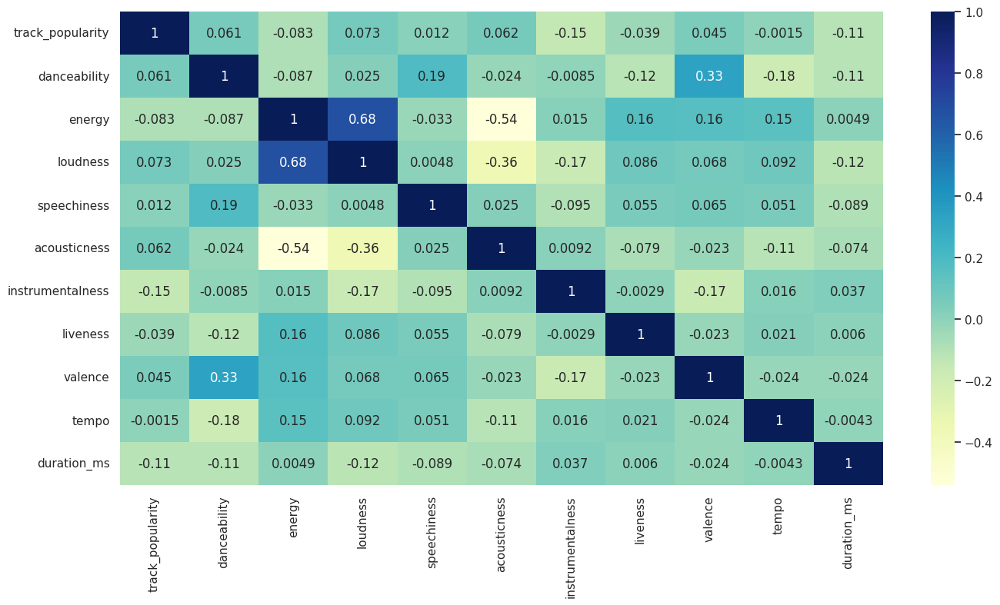

In [11]:
selected_columns = ['track_popularity', 
                    'danceability',
                    'energy',
                    'loudness',
                    'speechiness',
                    'acousticness',
                    'instrumentalness',
                    'liveness', 
                    'valence', 
                    'tempo', 
                    'duration_ms'
                   ]

df_set = df[selected_columns]

plt.figure(figsize=(16, 8))
sns.set(style="whitegrid")
sns.heatmap(df_set.corr(),annot=True, cmap='YlGnBu')




In [12]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

Text(0.5, 1.0, 'Scatterplot of Energy vs. Loudness (Correlation Coefficient: 0.68)')

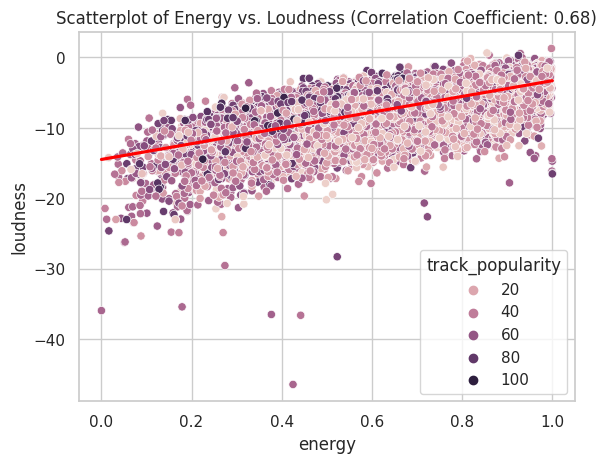

In [13]:
correlation_coefficient = df_set['energy'].corr(df_set['loudness'])
sns.scatterplot(data= df_set, x= 'energy', y='loudness', hue='track_popularity')
sns.regplot(data=df_set, x='energy', y='loudness', scatter=False, color='red')
plt.title(f'Scatterplot of Energy vs. Loudness (Correlation Coefficient: {correlation_coefficient:.2f})')

Text(0.5, 1.0, 'Scatterplot of Energy vs. Loudness (Correlation Coefficient: 0.68)')

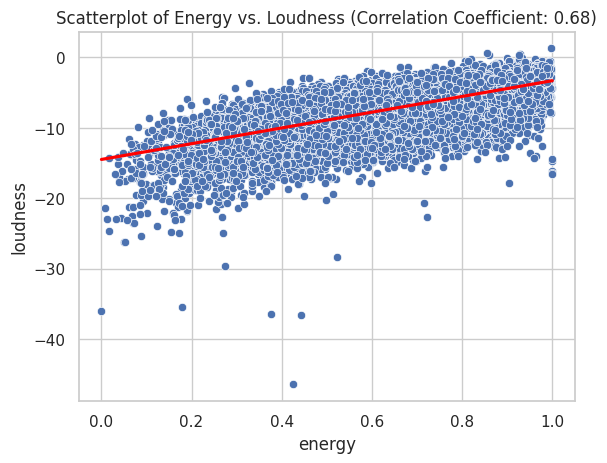

In [14]:
correlation_coefficient = df_set['energy'].corr(df_set['loudness'])
sns.scatterplot(data= df_set, x= 'energy', y='loudness')
sns.regplot(data=df_set, x='energy', y='loudness', scatter=False, color='red')
plt.title(f'Scatterplot of Energy vs. Loudness (Correlation Coefficient: {correlation_coefficient:.2f})')

In [15]:
import scipy.stats as stats

correlation_coefficient, p_value = stats.pearsonr(df_set['energy'], df_set['loudness'])

print(f"Correlation Coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

# Handling extremely small p-values
if p_value < 1e-10:
    print(f"P-value is extremely small and essentially zero: {p_value:.1e}")
else:
    print(f"P-value: {p_value}")

Correlation Coefficient: 0.6795502630357375
P-value: 0.0
P-value is extremely small and essentially zero: 0.0e+00


In [16]:
import scipy.stats as stats

correlation_coefficient, p_value = stats.pearsonr(df_set['danceability'], df_set['valence'])

print(f"Correlation Coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

# Handling extremely small p-values
if p_value < 1e-10:
    print(f"P-value is extremely small and essentially zero: {p_value:.1e}")
else:
    print(f"P-value: {p_value}")

Correlation Coefficient: 0.33333559222809384
P-value: 0.0
P-value is extremely small and essentially zero: 0.0e+00


In [17]:
import scipy.stats as stats

correlation_coefficient, p_value = stats.pearsonr(df_set['energy'], df_set['acousticness'])

print(f"Correlation Coefficient: {correlation_coefficient}")
print(f"P-value: {p_value}")

# Handling extremely small p-values
if p_value < 1e-10:
    print(f"P-value is extremely small and essentially zero: {p_value:.1e}")
else:
    print(f"P-value: {p_value}")

Correlation Coefficient: -0.5393529302133347
P-value: 0.0
P-value is extremely small and essentially zero: 0.0e+00


In [18]:

# Split the data
X = df_set[['energy', 'loudness']]
y = df_set['track_popularity']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [19]:
# Train the model
model = LinearRegression()
model.fit(X_train, y_train)


LinearRegression()

In [20]:
# Evaluate on training data
y_train_pred = model.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

In [21]:
# Evaluate on testing data
y_test_pred = model.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

In [22]:
# Print results
print("Training MSE: ", train_mse)
print("Training R2: ", train_r2)

print("Testing MSE: ", test_mse)
print("Testing R2: ", test_r2)

# Check for overfitting
if train_r2 > test_r2:
    print("The model might be overfitting. Training R2 is higher than testing R2.")
else:
    print("The model does not appear to be overfitting.")

Training MSE:  485.9567360940386
Training R2:  0.03840174787965411
Testing MSE:  481.5436858498006
Testing R2:  0.03715829343304866
The model might be overfitting. Training R2 is higher than testing R2.


In [23]:
# Split the data
X = df_set[['energy']]
y = df_set['loudness']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [24]:
# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [25]:
# Evaluate on training data
y_train_pred = model.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

In [26]:
# Evaluate on testing data
y_test_pred = model.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

In [27]:
# Print results
print("Training MSE: ", train_mse)
print("Training R2: ", train_r2)

print("Testing MSE: ", test_mse)
print("Testing R2: ", test_r2)

# Check for overfitting
if train_r2 > test_r2:
    print("The model might be overfitting. Training R2 is higher than testing R2.")
else:
    print("The model does not appear to be overfitting.")

Training MSE:  4.859585228670583
Training R2:  0.4546355751183455
Testing MSE:  4.577157410283385
Testing R2:  0.47869925486393583
The model does not appear to be overfitting.


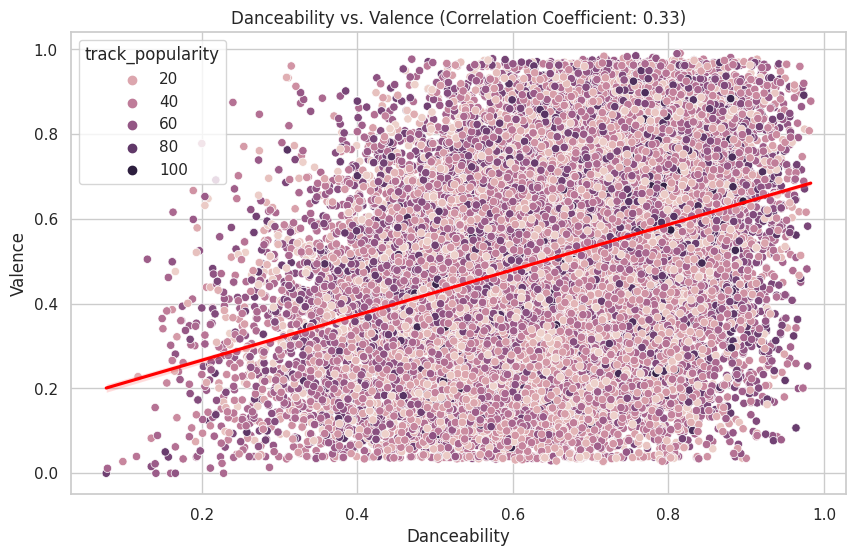

In [28]:

correlation_coefficient = df_set['danceability'].corr(df_set['valence'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_set, x='danceability', y='valence', hue='track_popularity')
sns.regplot(data=df_set, x='danceability', y='valence', scatter=False, color='red')
plt.title(f'Danceability vs. Valence (Correlation Coefficient: {correlation_coefficient:.2f})')
plt.xlabel('Danceability')
plt.ylabel('Valence')
plt.show()

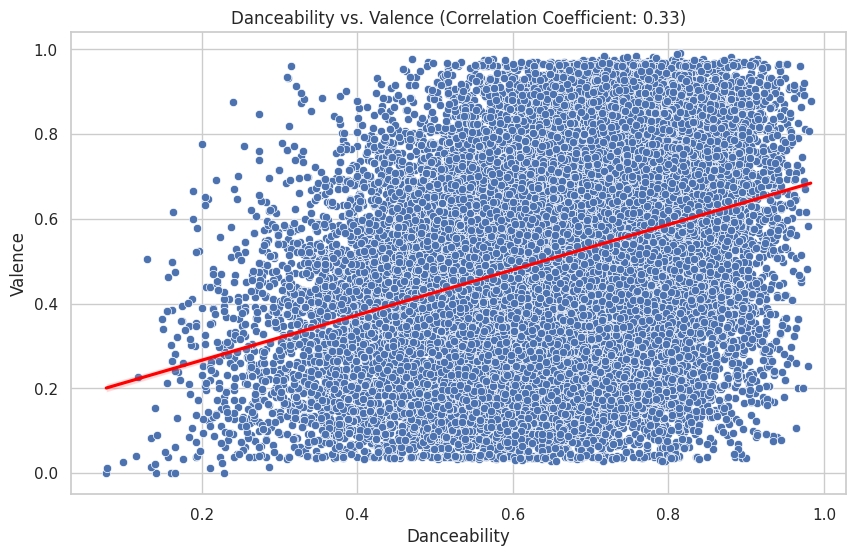

In [29]:
correlation_coefficient = df_set['danceability'].corr(df_set['valence'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_set, x='danceability', y='valence')
sns.regplot(data=df_set, x='danceability', y='valence', scatter=False, color='red')
plt.title(f'Danceability vs. Valence (Correlation Coefficient: {correlation_coefficient:.2f})')
plt.xlabel('Danceability')
plt.ylabel('Valence')
plt.show()

In [30]:
# Split the data
X = df_set[['danceability', 'valence']]
y = df_set['track_popularity']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [31]:
# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [32]:
# Evaluate on training data
y_train_pred = model.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

In [33]:
# Evaluate on testing data
y_test_pred = model.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

In [34]:
# Print results
print("Training MSE: ", train_mse)
print("Training R2: ", train_r2)

print("Testing MSE: ", test_mse)
print("Testing R2: ", test_r2)

# Check for overfitting
if train_r2 > test_r2:
    print("The model might be overfitting. Training R2 is higher than testing R2.")
else:
    print("The model does not appear to be overfitting.")


Training MSE:  503.3444918581223
Training R2:  0.0039953196748954145
Testing MSE:  497.4595133236005
Testing R2:  0.0053347581306285585
The model does not appear to be overfitting.


In [35]:
# Split the data
X = df_set[['danceability']]
y = df_set['valence']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [36]:
# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [37]:
# Evaluate on training data
y_train_pred = model.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

In [38]:
# Evaluate on testing data
y_test_pred = model.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

In [39]:
# Print results
print("Training MSE: ", train_mse)
print("Training R2: ", train_r2)

print("Testing MSE: ", test_mse)
print("Testing R2: ", test_r2)

# Check for overfitting
if train_r2 > test_r2:
    print("The model might be overfitting. Training R2 is higher than testing R2.")
else:
    print("The model does not appear to be overfitting.")


Training MSE:  0.047981896645074684
Training R2:  0.11068858177443675
Testing MSE:  0.04782002580569258
Testing R2:  0.1120947891869235
The model does not appear to be overfitting.


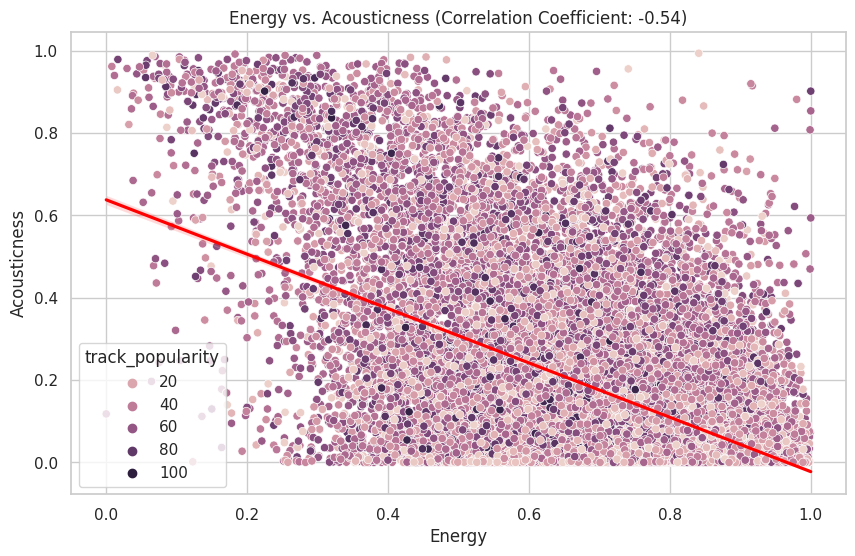

In [40]:
correlation_coefficient = df_set['energy'].corr(df_set['acousticness'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_set, x='energy', y='acousticness', hue='track_popularity')
sns.regplot(data=df_set, x='energy', y='acousticness', scatter=False, color='red')
plt.title(f'Energy vs. Acousticness (Correlation Coefficient: {correlation_coefficient:.2f})')
plt.xlabel('Energy')
plt.ylabel('Acousticness')
plt.show()

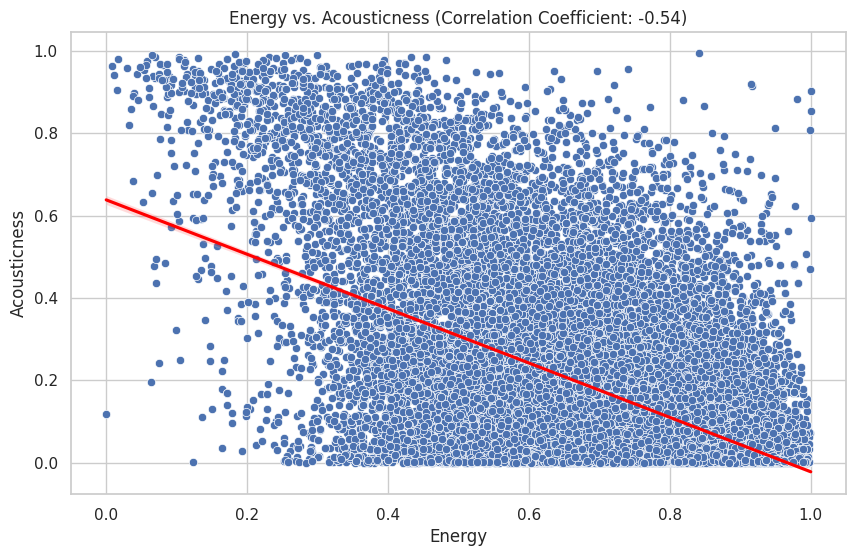

In [41]:
correlation_coefficient = df_set['energy'].corr(df_set['acousticness'])

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_set, x='energy', y='acousticness')
sns.regplot(data=df_set, x='energy', y='acousticness', scatter=False, color='red')
plt.title(f'Energy vs. Acousticness (Correlation Coefficient: {correlation_coefficient:.2f})')
plt.xlabel('Energy')
plt.ylabel('Acousticness')
plt.show()

In [42]:
# Split the data
X = df_set[['energy', 'acousticness']]
y = df_set['track_popularity']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [43]:
# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [44]:
# Evaluate on training data
y_train_pred = model.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

In [45]:
# Evaluate on testing data
y_test_pred = model.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

In [46]:
# Print results
print("Training MSE: ", train_mse)
print("Training R2: ", train_r2)

print("Testing MSE: ", test_mse)
print("Testing R2: ", test_r2)

# Check for overfitting
if train_r2 > test_r2:
    print("The model might be overfitting. Training R2 is higher than testing R2.")
else:
    print("The model does not appear to be overfitting.")


Training MSE:  501.30350579421093
Training R2:  0.00803396856251859
Testing MSE:  497.23986429829336
Testing R2:  0.005773944124728425
The model might be overfitting. Training R2 is higher than testing R2.


In [47]:
# Split the data
X = df_set[['energy']]
y = df_set['acousticness']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [48]:
# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [49]:
# Evaluate on training data
y_train_pred = model.predict(X_train)
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)

In [50]:
# Evaluate on testing data
y_test_pred = model.predict(X_test)
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

In [51]:
# Print results
print("Training MSE: ", train_mse)
print("Training R2: ", train_r2)

print("Testing MSE: ", test_mse)
print("Testing R2: ", test_r2)

# Check for overfitting
if train_r2 > test_r2:
    print("The model might be overfitting. Training R2 is higher than testing R2.")
else:
    print("The model does not appear to be overfitting.")

Training MSE:  0.03497536378371792
Training R2:  0.2892036456088377
Testing MSE:  0.03435016575727579
Testing R2:  0.2948473240099899
The model does not appear to be overfitting.


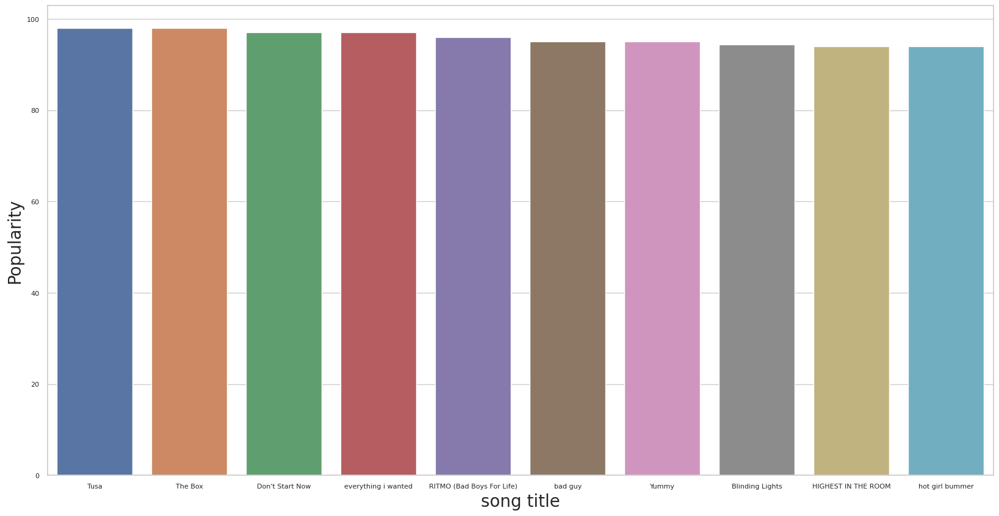

In [52]:
plt.figure(figsize=(20, 10))
sns.set(style="whitegrid")

x = df.groupby("track_name")["track_popularity"].mean().sort_values(ascending=False).head(10)
axis = sns.barplot(x=x.index, y=x)

axis.set_ylabel('Popularity', fontsize=20)
axis.set_xlabel('song title', fontsize=20)
axis.tick_params(labelsize=8)  

KeyError: 'track_name'

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


Text(0.5, 0, 'artist')

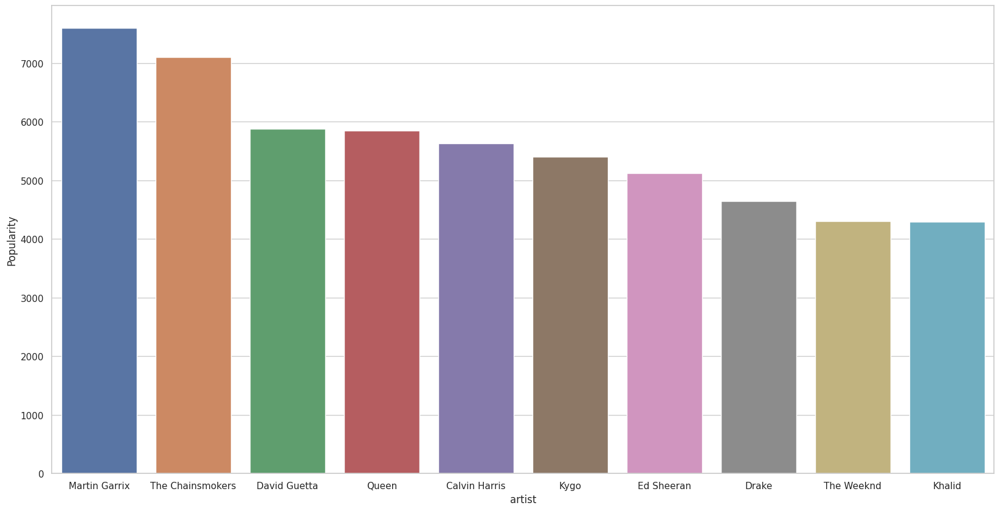

In [53]:
from collections import Counter

artist_popularity_sum = Counter()


for l in df[["track_artist", "track_popularity"]].to_numpy():
  artist_list = [x.strip() for x in l[0].split(',')]
  for artist in artist_list:
    artist_popularity_sum[artist] += float(l[1])

#split separates artists names
#strip gets rid of spaces
#popularity add points to an artist


top_10_artist = artist_popularity_sum.most_common(10)
xs = [a[0] for a in top_10_artist]
ys = [a[1] for a in top_10_artist]

plt.figure(figsize=(20, 10))
sns.set(style="whitegrid")
axis = sns.barplot(x=xs, y=ys)

axis.set_ylabel('Popularity')
axis.set_xlabel('artist')